# Outil d'OCRisation automatique de fichiers images
Tesseract / pytesseract


In [ ]:
#@title Installation des bibliothèques nécessaires et connexion à un compte Google Drive.

''' 
Google Colab notebook.
Python == 3.7.11

BaOIA - La Contemporaine - Université de Nanterre
'''


## Installation des bibliothèques et connexion au compte Google Drive

!sudo apt install tesseract-ocr
!pip install pytesseract
import pytesseract==0.3.7
import shutil
import os
import random
try:
 from PIL import Image
except ImportError:
 import Image

from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/My Drive/tesseract/

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving bpt6k145420f_35.jpg to bpt6k145420f_35.jpg


In [ ]:
image_path_in_colab='/content/drive/MyDrive/tesseract/guide_test.jpg'
extractedInformation = pytesseract.image_to_string(Image.open(image_path_in_colab))
print(extractedInformation)

4

300

825 mét.), v. de 650 hab., situe sur
le Jalon 4 g., et presque engloutli
dans des tranchées de terres rouges.
Ses maisons sont mal balies et pau-
vres; ’église paroissiale est fort an-
clenne, mais sansinterét. Au som-
mel de la colline qui domine le vil-
lage, on apercoit les ruines décon-
ronnées d’un vicux chateau qui ne
conserve plus que quatre murailles
épaisses et solides. — La voie s’éleve
a parlir d’Arcos, et par des rampes
de 13 4 14 millim. par métre, pour
aborder les contreforts de la sterra
de Muedo. Elle traverse les belles
roches majestueuses de l’un de ces
contreforts, auprés du village de
Somaen, par un tunnel de 100 mét.;
puis le Jalon au-dessus d’un ravin
de 15 mét.:; puis encore de petils
Lunnels, des tranchées profondes et
des remblais de 14 4415 met., au
pied desquels, adr., ila fallu dévier
le cours de la riviére et le trace pil-
Loresque de la route.

Plus loin, on rencontre la mon-
lagne de Jubera, surmontée d’une
ruine, eb sous laquelle est perce un
tun

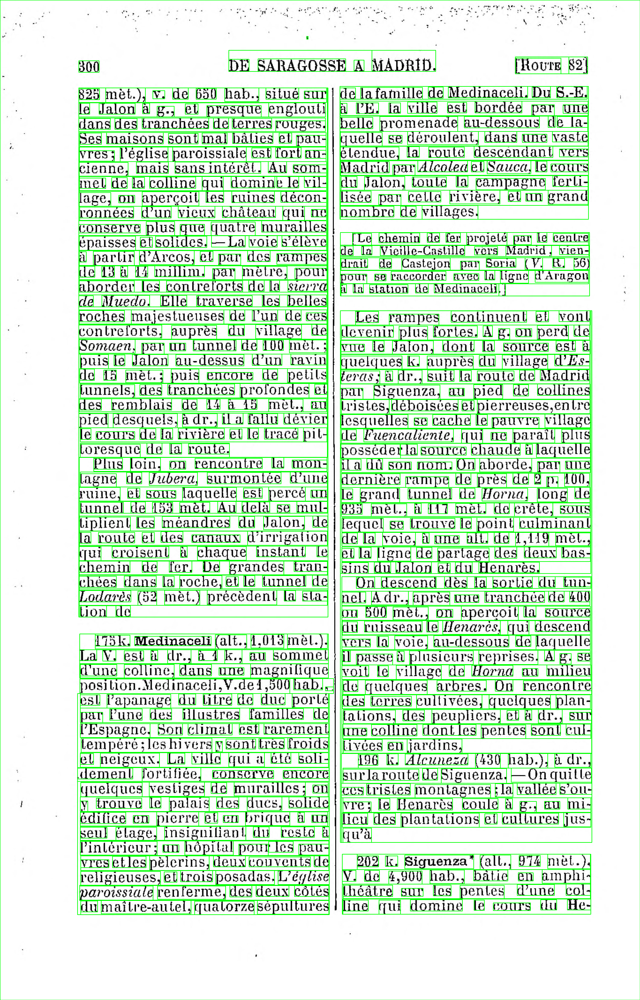

-1

In [ ]:
from pytesseract import Output
import cv2
from google.colab.patches import cv2_imshow
img = cv2.imread('guide_test.jpg')

d = pytesseract.image_to_data(img, output_type=Output.DICT)
n_boxes = len(d['level'])
for i in range(n_boxes):
    (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

cv2_imshow(img)
cv2.waitKey(0)



In [ ]:
print(pytesseract.image_to_boxes(Image.open(image_path_in_colab)))

In [ ]:
hocr = pytesseract.image_to_pdf_or_hocr('guide_test.jpg', extension='hocr')
with open('test_guide_simple.hocr', 'w+b') as f:
    f.write(hocr)